In [1]:
from keras.models import Sequential,Model
from keras.layers.core import Dense, Dropout, Activation, Flatten
from keras.layers import Embedding,GRU,TimeDistributed,RepeatVector,Merge,BatchNormalization,Input
from keras.layers.convolutional import Convolution2D, MaxPooling2D, ZeroPadding2D
from keras.layers import Embedding,LSTM,GRU,TimeDistributed,RepeatVector,Merge,Input,merge,UpSampling2D
from keras.preprocessing import sequence
from keras import callbacks
from keras.optimizers import SGD, RMSprop, Adam

import numpy as np
from vgg16 import Vgg16
import matplotlib.pyplot as plt
import PIL.Image

from tqdm import tqdm

from utils import *

import cPickle as pickle
import string

import collections
import nltk
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.corpus import stopwords

import re
from numpy.random import random, permutation, randn, normal 

import os

import preprocessing as preproc

import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
from matplotlib import animation
from IPython.display import display, HTML

import pandas as pd
import languageUtils
import nnModel
import nnModel_no_feedback
import plotter
import videoExplorer as vidExplorer

Using Theano backend.
Using gpu device 0: GeForce GTX 1080 (CNMeM is disabled, cuDNN 5110)
/opt/conda/lib/python2.7/site-packages/theano/sandbox/cuda/__init__.py:600: UserWarning: Your cuDNN version is more recent than the one Theano officially supports. If you see any problems, try updating Theano or downgrading cuDNN to version 5.
  warnings.warn(warn)


In [20]:
def make_prediction_verbose(image_index,images_concat_t,vgg_model,model,word2index, index2word, MAX_CAPTION_LEN):
    
    print("-------------- Image %d -------------------"%image_index)
    
    startIndex = word2index["START"]
    start_captions = [[startIndex]]
    start_captions = sequence.pad_sequences(start_captions, maxlen=MAX_CAPTION_LEN,padding='post')

    
    img = np.expand_dims(images_concat_t[image_index], axis=0)
    
    print("Image shape before Image Model"+str(img.shape))
    img_vgg_features = vgg_model.predict(img)
    img_vgg_features = np.squeeze(img_vgg_features)[0].reshape(1,4096)
    
    print("Image shape ater Image Model"+str(img_vgg_features.shape))
    
    indexed_caption = np.expand_dims(start_captions[0], axis=0) 
    prev_word_indexed_captions = np.expand_dims(list(start_captions[0]), axis=0)

    reached_end = False
    i = 0
        
    print("Generating words...")
    while ((not reached_end) & (i < MAX_CAPTION_LEN-1)):
       
        predictions = model.predict([img_vgg_features, indexed_caption, prev_word_indexed_captions])
        predictions = predictions[0]
        
        currentPred = predictions[i]
        
        max_index = np.argmax(currentPred)
        
        indexed_caption[0,i+1] = max_index
        
        prev_word_indexed_captions[0,i+1] = indexed_caption[0,i]
                
        i+=1

        print("\tTimestep %d => %s"%(i,index2word[max_index]))
        
        if(index2word[max_index] == "END"):
            reached_end = True

    caption = ' '.join([index2word[x] for x in indexed_caption[0][1:i]])
    
    return (img[0],caption)

def make_prediction_on_dataset_verbose(images_concat_t, model, word2index, index2word, MAX_CAPTION_LEN,):
    
    nr_images = len(images_concat_t)
    print("Generating predictions for %d images"%nr_images)
        
    print("Constructing Image Model...")
    vgg_model = nnModel.get_vgg_model(MAX_CAPTION_LEN)
    
    images2Captions = [make_prediction_verbose(i,images_concat_t,vgg_model,model,word2index, index2word, MAX_CAPTION_LEN) 
                       for i in range(nr_images)]
    
    images = [np.transpose(image2Caption[0],(1,2,0)) for image2Caption in images2Captions]
    predicted_captions = [image2Caption[1] for image2Caption in images2Captions]
        
    return (images,predicted_captions)

def search_predictions_by(searched_word,images,predicted_captions):
    lmtzr = WordNetLemmatizer()
    lemm_word = lmtzr.lemmatize(searched_word)
    
    found_indexes = []
    for index,caption in enumerate(predicted_captions):
        lemm_caption_words = [lmtzr.lemmatize(word) for word in caption.split()]
        if lemm_word in lemm_caption_words:
            found_indexes.append(index)
   
    
    return ([images[i] for i in found_indexes],[predicted_captions[i] for i in found_indexes],found_indexes)
    
def load_test_images():
    return preproc.get_images_concat(val_path + images_concat_folder+ 'images_concat_0.bc',1000)[300:350]

def load_more_test_images():
    return preproc.get_images_concat(val_path + images_concat_folder+ 'images_concat_0.bc',1000)[100:400]

def search_video_for_word(video_search_word,raw_video_frames,raw_video_captions):
    found_frames,found_frame_captions,_ = vidExplorer.search_video_by(video_search_word,raw_video_frames,raw_video_captions)
    plotter.plot_predictions(found_frames[:10],found_frame_captions[:10])

def search_dataset_for_word(search_word,more_prediction_images,more_predicted_captions):
    (found_images,found_captions,_) = search_predictions_by(search_word,more_prediction_images,more_predicted_captions)
    plotter.plot_predictions(found_images,found_captions)
    
def load_video_frames():
    video_path = "/home/docker/fastai-courses/deeplearning1/nbs/persistent/coco/video/all-merged.mov"
    video_frames = vidExplorer.get_mp4_vid_frames(video_path)
    return video_frames

In [4]:
base_path = data_path+"app-100-length-15/"
val_path = base_path + val_folder

(unique_words, word2index, index2word) = languageUtils.load_language_data_structures(base_path + general_datastruct_folder)

EMB_SIZE = 300
VOCAB_SIZE = len(unique_words)
MAX_CAPTION_LEN = 15 

emb = nnModel.get_embeddings(index2word, VOCAB_SIZE, EMB_SIZE)

# Model Building

In [5]:
model = nnModel.build_model(emb,MAX_CAPTION_LEN, VOCAB_SIZE, EMB_SIZE)
model.load_weights(save_path + models_folder+"big/" +'app_100_length_15_past_word_20_epoch_300d_gru_2x1048_big.h5')

In [6]:
model.summary()

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
repeatvector_1 (RepeatVector)    (None, 15, 4096)      0                                            
____________________________________________________________________________________________________
embedding_1 (Embedding)          (None, 15, 300)       254700                                       
____________________________________________________________________________________________________
batchnormalization_1 (BatchNorma (None, 15, 300)       1200                                         
____________________________________________________________________________________________________
embedding_2 (Embedding)          (None, 15, 300)       254700                                       
___________________________________________________________________________________________

# Caption Generation

In [7]:
stacked_images = load_test_images()
stacked_images.shape

(50, 3, 224, 224)

In [8]:
(prediction_images,predicted_captions) = make_prediction_on_dataset_verbose(stacked_images,model,word2index,index2word,MAX_CAPTION_LEN)

Generating predictions for 50 images
Constructing Image Model...
-------------- Image 0 -------------------
Image shape before Image Model(1, 3, 224, 224)
Image shape ater Image Model(1, 4096)
Generating words...
	Timestep 1 => A
	Timestep 2 => dog
	Timestep 3 => laying
	Timestep 4 => on
	Timestep 5 => a
	Timestep 6 => bed
	Timestep 7 => with
	Timestep 8 => a
	Timestep 9 => remote
	Timestep 10 => END
-------------- Image 1 -------------------
Image shape before Image Model(1, 3, 224, 224)
Image shape ater Image Model(1, 4096)
Generating words...
	Timestep 1 => A
	Timestep 2 => traffic
	Timestep 3 => light
	Timestep 4 => hanging
	Timestep 5 => from
	Timestep 6 => a
	Timestep 7 => pole
	Timestep 8 => under
	Timestep 9 => a
	Timestep 10 => traffic
	Timestep 11 => light
	Timestep 12 => END
-------------- Image 2 -------------------
Image shape before Image Model(1, 3, 224, 224)
Image shape ater Image Model(1, 4096)
Generating words...
	Timestep 1 => A
	Timestep 2 => group
	Timestep 3 => of

/opt/conda/lib/python2.7/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


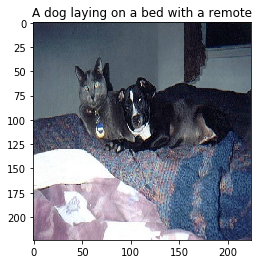

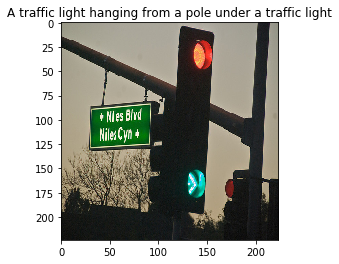

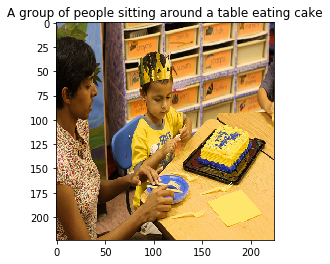

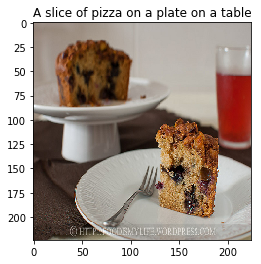

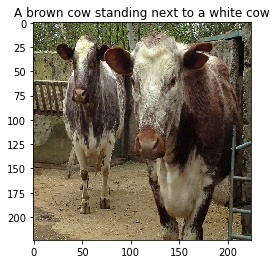

...

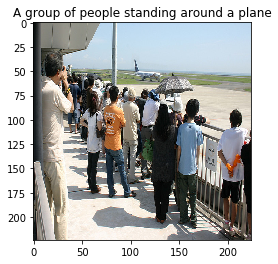

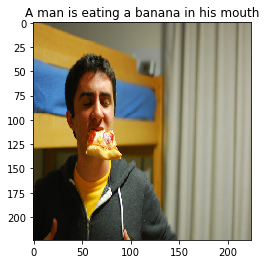

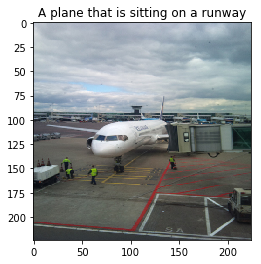

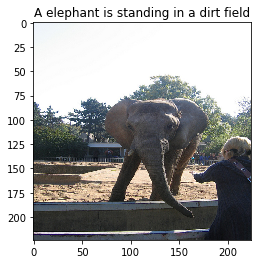

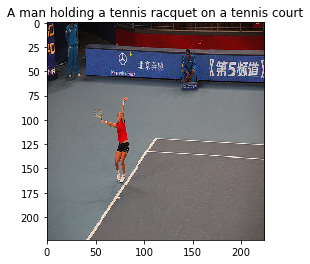

In [9]:
plotter.plot_predictions(prediction_images,predicted_captions)

# Keywoard search

In [10]:
more_images = load_more_test_images()
more_images.shape

(300, 3, 224, 224)

In [11]:
(more_prediction_images,more_predicted_captions) = make_prediction_on_dataset_verbose(more_images,model,word2index,index2word,MAX_CAPTION_LEN)

Generating predictions for 300 images
Constructing Image Model...
-------------- Image 0 -------------------
Image shape before Image Model(1, 3, 224, 224)
Image shape ater Image Model(1, 4096)
Generating words...
	Timestep 1 => A
	Timestep 2 => woman
	Timestep 3 => is
	Timestep 4 => standing
	Timestep 5 => outside
	Timestep 6 => talking
	Timestep 7 => on
	Timestep 8 => a
	Timestep 9 => cellphone
	Timestep 10 => END
-------------- Image 1 -------------------
Image shape before Image Model(1, 3, 224, 224)
Image shape ater Image Model(1, 4096)
Generating words...
	Timestep 1 => A
	Timestep 2 => clock
	Timestep 3 => tower
	Timestep 4 => in
	Timestep 5 => the
	Timestep 6 => middle
	Timestep 7 => of
	Timestep 8 => a
	Timestep 9 => building
	Timestep 10 => END
-------------- Image 2 -------------------
Image shape before Image Model(1, 3, 224, 224)
Image shape ater Image Model(1, 4096)
Generating words...
	Timestep 1 => A
	Timestep 2 => man
	Timestep 3 => riding
	Timestep 4 => skis
	Timestep

In [12]:
common_words2app = languageUtils.most_common_words(more_predicted_captions,500)
common_words2app[:20]

[(u'man', 96),
 (u'standing', 58),
 (u'riding', 42),
 (u'sitting', 40),
 (u'group', 38),
 (u'street', 35),
 (u'field', 35),
 (u'table', 30),
 (u'people', 29),
 (u'woman', 27),
 (u'next', 23),
 (u'top', 22),
 (u'snow', 22),
 (u'skis', 20),
 (u'building', 20),
 (u'covered', 19),
 (u'playing', 19),
 (u'slope', 16),
 (u'tennis', 15),
 (u'beach', 13)]

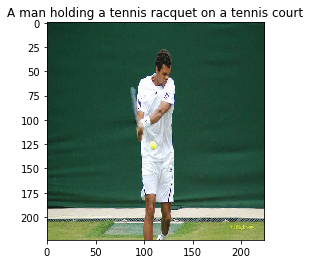

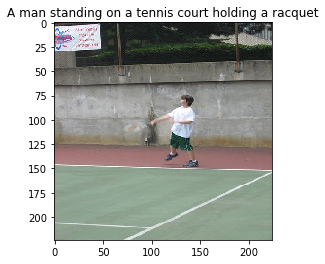

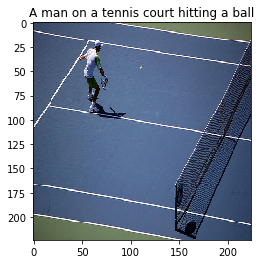

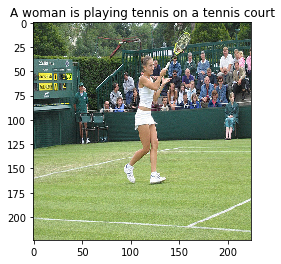

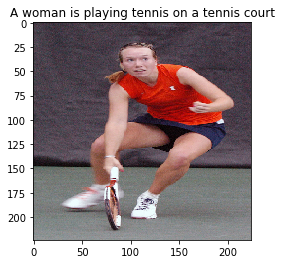

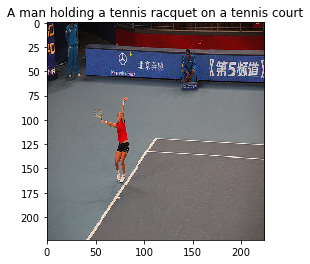

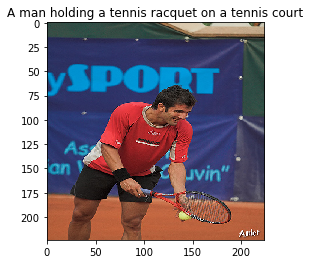

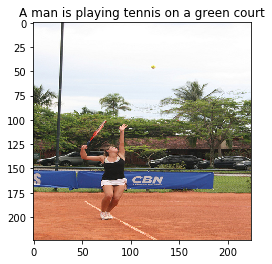

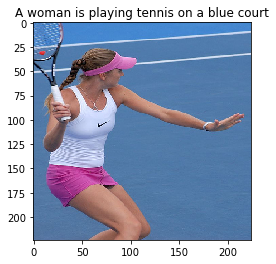

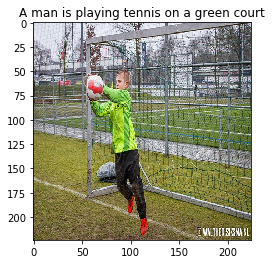

In [15]:
search_word = "tennis"
search_dataset_for_word(search_word,more_prediction_images,more_predicted_captions)

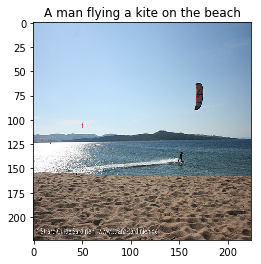

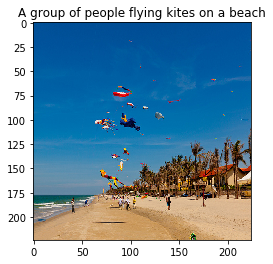

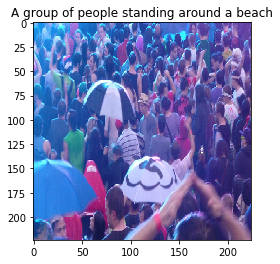

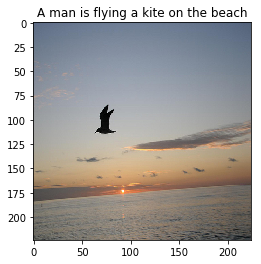

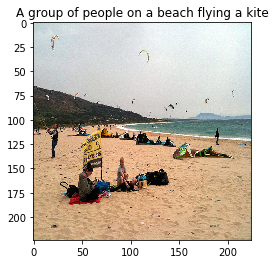

...

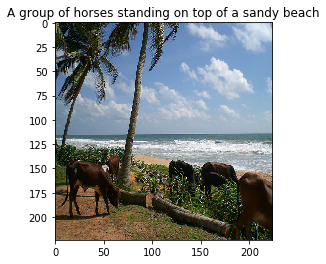

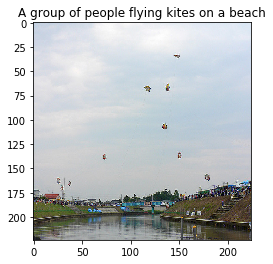

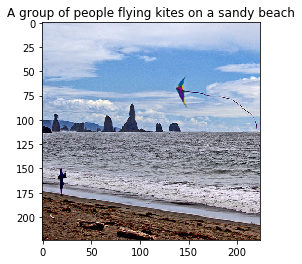

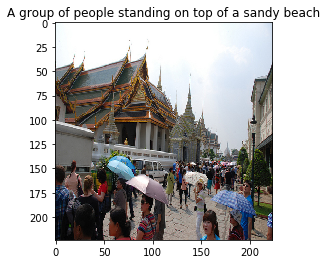

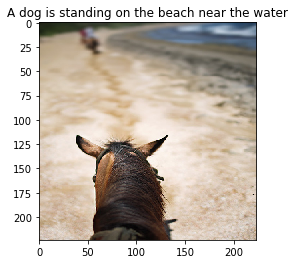

In [16]:
search_word = "beach"
search_dataset_for_word(search_word,more_prediction_images,more_predicted_captions)

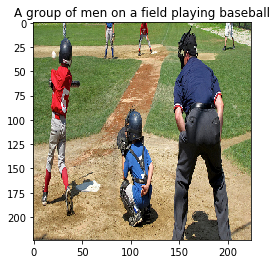

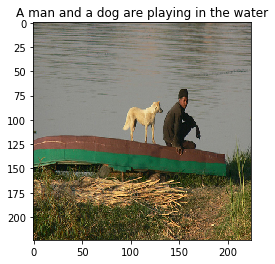

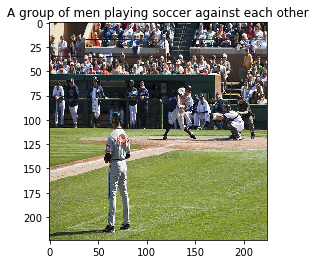

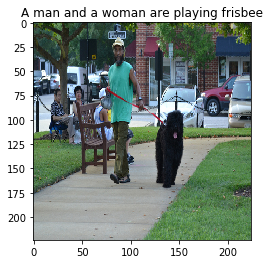

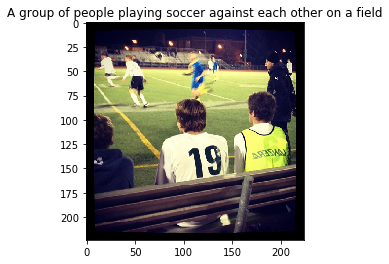

...

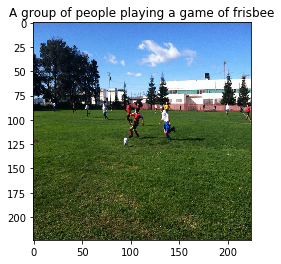

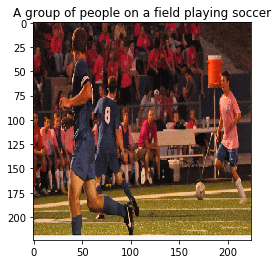

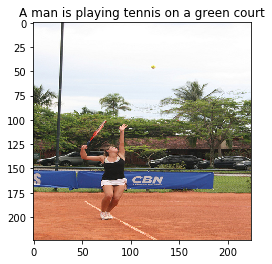

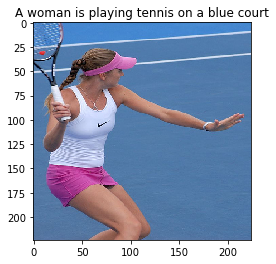

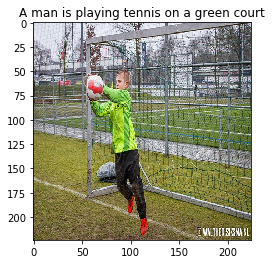

In [17]:
search_word = "playing"
search_dataset_for_word(search_word,more_prediction_images,more_predicted_captions)

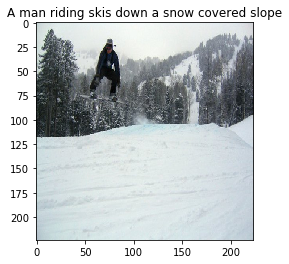

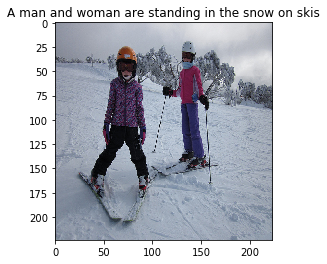

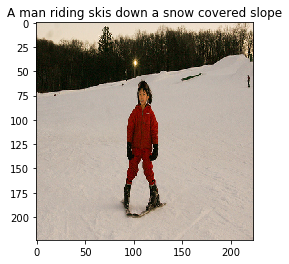

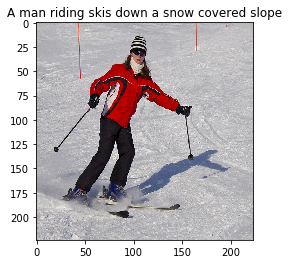

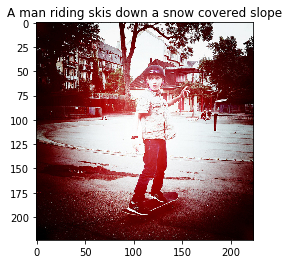

...

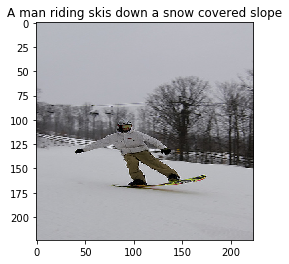

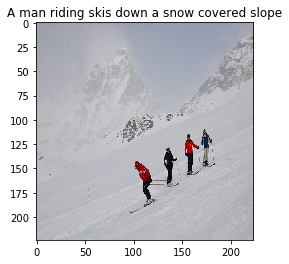

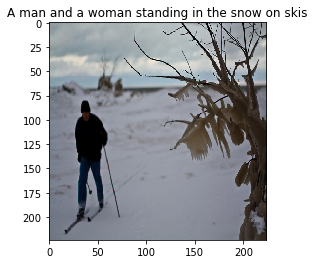

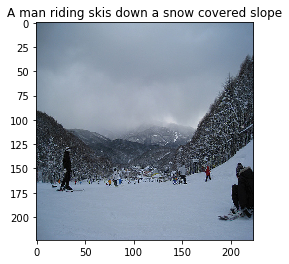

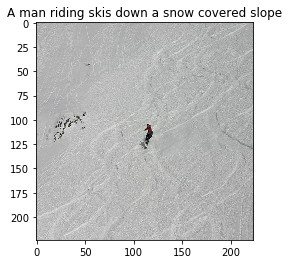

In [18]:
search_word = "snow"
search_dataset_for_word(search_word,more_prediction_images,more_predicted_captions)

# Video search

In [23]:
reload(vidExplorer)

<module 'videoExplorer' from 'videoExplorer.py'>

In [24]:
video_frames = load_video_frames()
video_frames.shape



0it [00:00, ?it/s]

12it [00:00, 113.52it/s]

24it [00:00, 112.61it/s]

35it [00:00, 111.26it/s]

47it [00:00, 110.73it/s]

58it [00:00, 110.23it/s]

69it [00:00, 109.15it/s]

80it [00:00, 108.87it/s]

91it [00:00, 108.34it/s]

102it [00:00, 108.27it/s]

114it [00:01, 108.88it/s]

126it [00:01, 110.01it/s]

138it [00:01, 110.93it/s]

150it [00:01, 111.43it/s]

162it [00:01, 111.80it/s]

174it [00:01, 112.57it/s]

186it [00:01, 113.07it/s]

198it [00:01, 114.00it/s]

210it [00:01, 115.52it/s]

222it [00:01, 116.14it/s]

234it [00:02, 116.87it/s]

246it [00:02, 117.24it/s]

258it [00:02, 117.07it/s]

270it [00:02, 117.69it/s]

283it [00:02, 118.25it/s]

295it [00:02, 118.60it/s]

307it [00:02, 118.26it/s]

319it [00:02, 117.85it/s]

331it [00:02, 118.17it/s]

343it [00:03, 117.57it/s]

355it [00:03, 117.62it/s]

367it [00:03, 117.76it/s]

379it [00:03, 117.50it/s]

392it [00:03, 118.88it/s]

404it [00:03, 118.66it/s]

417it [00:03, 119.46it/s]

429it [00:03, 118.93it/s]

441it [00:03, 

(37, 3, 224, 224)

In [25]:
(raw_video_frames,raw_video_captions) = nnModel.make_prediction_on_dataset(video_frames,model,
                                                                       word2index,index2word,MAX_CAPTION_LEN)

100%|██████████| 37/37 [00:06<00:00, 10.22it/s]


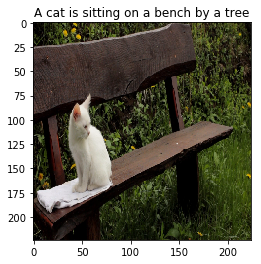

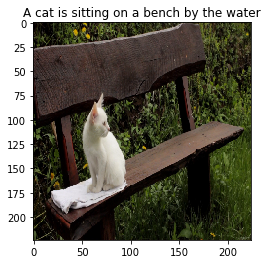

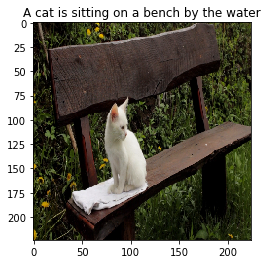

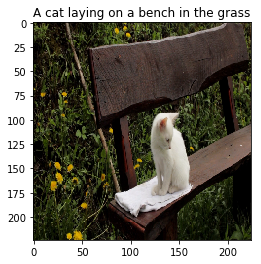

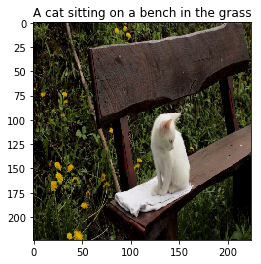

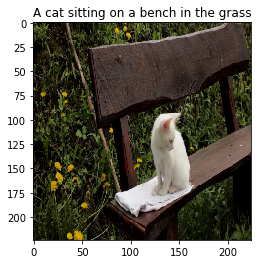

In [26]:
video_search_word = "cat"
search_video_for_word(video_search_word,raw_video_frames,raw_video_captions)

In [ ]:
video_search_word = "boat"
search_video_for_word(video_search_word,raw_video_frames,raw_video_captions)

In [ ]:
video_search_word = "flowers"
search_video_for_word(video_search_word,raw_video_frames,raw_video_captions)